Complete the exercises: 9 (in addition check how sensitive your results to the size of the training set) and 10
(use 3D dimensional reduction and scatter plot for 3D) after the Chapter 8.


## 8.9

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split

In [ ]:
def load_mnist():
    mnist = fetch_openml('mnist_784', as_frame=False, parser="auto")
    X, y = mnist.data, mnist.target
    return X, y

def prepare_data(X, y, size):
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=size, random_state=42)
    return X_train, X_test, y_train, y_test

def apply_pca(X_train, X_test, variance=0.95):
    pca = PCA(n_components=variance)
    X_train_reduced = pca.fit_transform(X_train)
    X_test_reduced = pca.transform(X_test)
    return X_train_reduced, X_test_reduced


In [ ]:
def train_and_evaluate(classifier, X_train, y_train, X_test, y_test):
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    return accuracy_score(y_test, y_pred)

def run_experiment(train_sizes, use_pca=False):
    X, y = load_mnist()
    results = {}
    for size in train_sizes:
        X_train, X_test, y_train, y_test = prepare_data(X, y, size)
        if use_pca:
            X_train, X_test = apply_pca(X_train, X_test)
        for clf, name in [(RandomForestClassifier(n_estimators=100, random_state=42), 'RandomForest'),
                          (SGDClassifier(random_state=42), 'SGD')]:
            accuracy = train_and_evaluate(clf, X_train, y_train, X_test, y_test)
            results[(size, name, 'PCA' if use_pca else 'No PCA')] = accuracy
    return results


In [ ]:
%timeit
train_sizes = [0.1, 0.2, 0.5, 0.8]
results_no_pca = run_experiment(train_sizes, use_pca=False)
results_pca = run_experiment(train_sizes, use_pca=True)

# Display the results
for key, value in results_no_pca.items():
    print(f'Train Size: {key[0]}, Classifier: {key[1]}, PCA: {key[2]}, Accuracy: {value:.4f}')

for key, value in results_pca.items():
    print(f'Train Size: {key[0]}, Classifier: {key[1]}, PCA: {key[2]}, Accuracy: {value:.4f}')

Train Size: 0.1, Classifier: RandomForest, PCA: No PCA, Accuracy: 0.9432
Train Size: 0.1, Classifier: SGD, PCA: No PCA, Accuracy: 0.8532
Train Size: 0.2, Classifier: RandomForest, PCA: No PCA, Accuracy: 0.9537
Train Size: 0.2, Classifier: SGD, PCA: No PCA, Accuracy: 0.8813
Train Size: 0.5, Classifier: RandomForest, PCA: No PCA, Accuracy: 0.9641
Train Size: 0.5, Classifier: SGD, PCA: No PCA, Accuracy: 0.8563
Train Size: 0.8, Classifier: RandomForest, PCA: No PCA, Accuracy: 0.9673
Train Size: 0.8, Classifier: SGD, PCA: No PCA, Accuracy: 0.8717
Train Size: 0.1, Classifier: RandomForest, PCA: PCA, Accuracy: 0.9093
Train Size: 0.1, Classifier: SGD, PCA: PCA, Accuracy: 0.7537
Train Size: 0.2, Classifier: RandomForest, PCA: PCA, Accuracy: 0.9248
Train Size: 0.2, Classifier: SGD, PCA: PCA, Accuracy: 0.8169
Train Size: 0.5, Classifier: RandomForest, PCA: PCA, Accuracy: 0.9398
Train Size: 0.5, Classifier: SGD, PCA: PCA, Accuracy: 0.8797
Train Size: 0.8, Classifier: RandomForest, PCA: PCA, Accura

### 8.10

In [ ]:
from sklearn.manifold import TSNE

mnist = fetch_openml('mnist_784', as_frame=False, parser="auto")
X_train = mnist.data[:60000]
y_train = mnist.target[:60000]

X_test = mnist.data[60000:]
y_test = mnist.target[60000:]

X_sample, y_sample = X_train[:5000], y_train[:5000]

tsne = TSNE(n_components=3, init="random", learning_rate="auto",
            random_state=42)

%time X_reduced = tsne.fit_transform(X_sample)



CPU times: user 4min 46s, sys: 328 ms, total: 4min 46s
Wall time: 2min 44s


In [ ]:
plt.figure(figsize=(13, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1],
            c=y_sample.astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

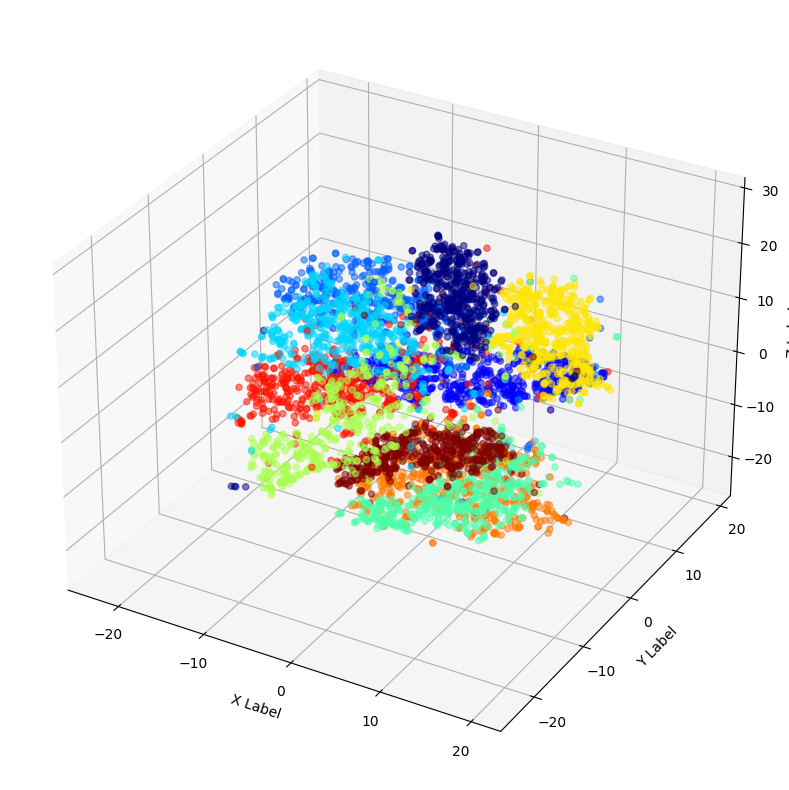

In [ ]:
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(projection='3d')
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2],
            c=y_sample.astype(np.int8), cmap="jet", alpha=0.5)

# Set axis labels
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# Show the plot
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.04, images=None, figsize=(13, 10)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the digits plotted so far.
    # We pretend that one is already plotted far away at the start, to
    # avoid `if` statements in the loop below
    neighbors = np.array([[10., 10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet
    digits = np.unique(y)
    for digit in digits:
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1],
                    c=[cmap(float(digit) / 9)], alpha=0.5)
    plt.axis("off")
    ax = plt.gca()  # get current axes
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])),
                         color=cmap(float(y[index]) / 9),
                         fontdict={"weight": "bold", "size": 16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)

CPU times: user 410 ms, sys: 77.7 ms, total: 487 ms
Wall time: 275 ms


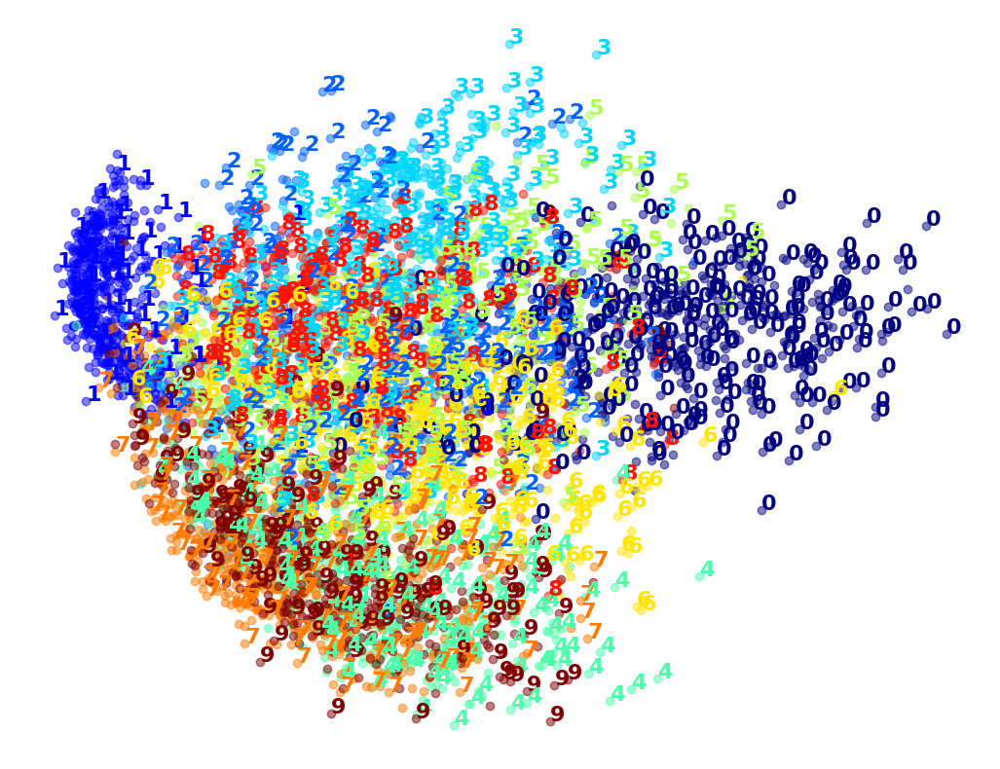

In [ ]:
pca = PCA(n_components=3, random_state=42)
%time X_pca_reduced = pca.fit_transform(X_sample)
plot_digits(X_pca_reduced, y_sample)

CPU times: user 5.76 s, sys: 2.03 s, total: 7.79 s
Wall time: 7.21 s


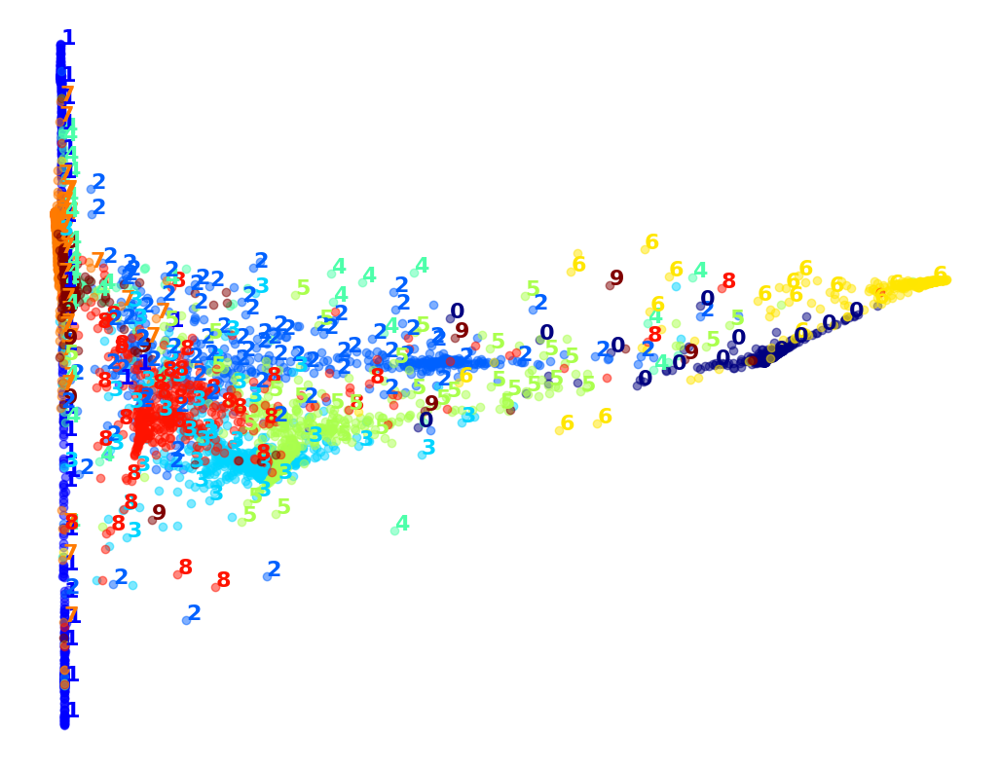

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components=3, random_state=42)
%time X_lle_reduced = lle.fit_transform(X_sample)
plot_digits(X_lle_reduced, y_sample)

CPU times: user 5.94 s, sys: 2.73 s, total: 8.66 s
Wall time: 8.57 s


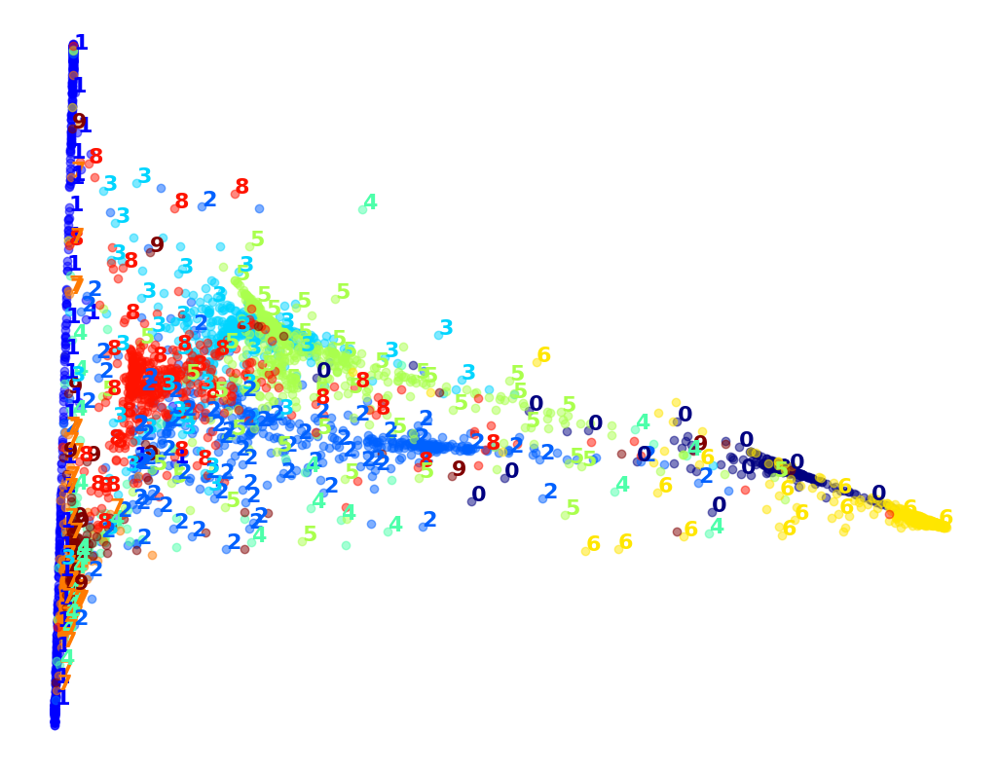

In [ ]:
from sklearn.pipeline import make_pipeline

pca_lle = make_pipeline(PCA(n_components=0.95),
                        LocallyLinearEmbedding(n_components=3, random_state=42))

%time X_pca_lle_reduced = pca_lle.fit_transform(X_sample)
plot_digits(X_pca_lle_reduced, y_sample)

CPU times: user 2.27 s, sys: 318 ms, total: 2.59 s
Wall time: 1.68 s


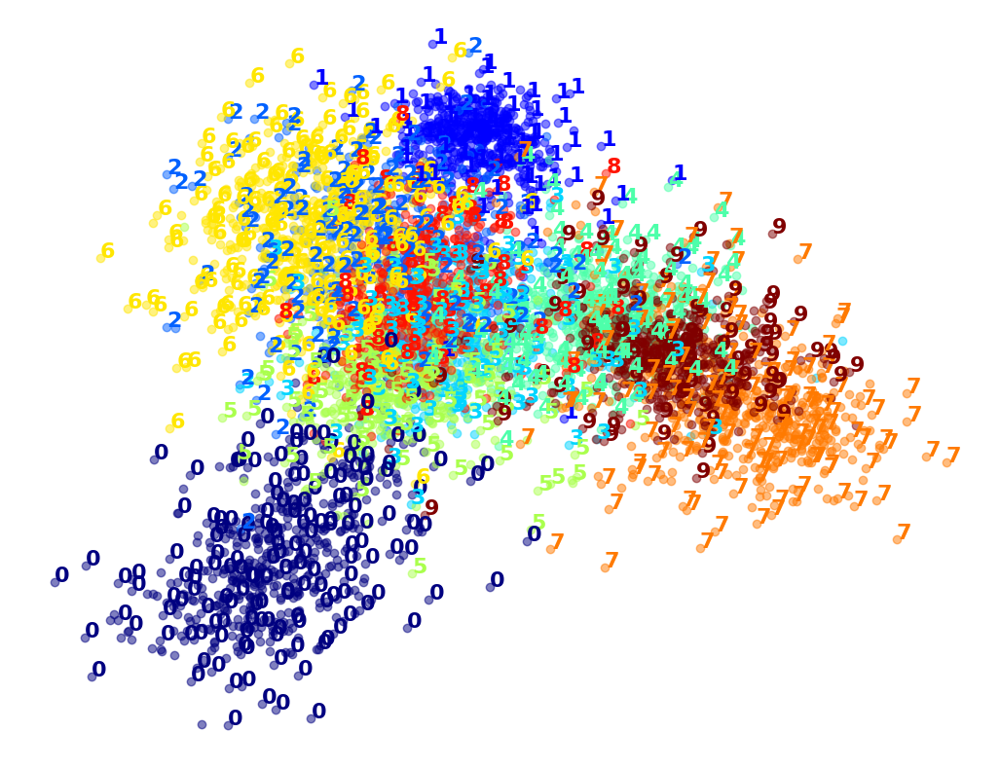

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=3)
%time X_lda_reduced = lda.fit_transform(X_sample, y_sample)
plot_digits(X_lda_reduced, y_sample)

## 10.10

**Change the data set and complete exercises 10 after the Chapter 10. Discuss the results and submit a short write-up based on your code output.**

### Reuters newswire classification dataset.

This is a dataset of 11,228 newswires from Reuters, labeled over 46 topics.

Each newswire is encoded as a list of word indexes (integers). For convenience, words are indexed by overall frequency in the dataset, so that for instance the integer "3" encodes the 3rd most frequent word in the data. This allows for quick filtering operations such as: "only consider the top 10,000 most common words, but eliminate the top 20 most common words".

As a convention, "0" does not stand for a specific word, but instead is used to encode any unknown word.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.datasets import reuters

def load_data():
    (X_train, y_train), (X_test, y_test) = reuters.load_data(num_words=10000,
                                                             test_split=0.2)
    return X_train, y_train, X_test, y_test

def dataset_statistics(X_train, y_train):
    num_samples_per_class = np.bincount(y_train)
    avg_length = np.mean([len(x) for x in X_train])
    median_length = np.median([len(x) for x in X_train])
    max_length = np.max([len(x) for x in X_train])

    print(f"Total number of training samples: {len(X_train)}")
    print(f"Number of classes: {len(num_samples_per_class)}")
    print(f"Average newswire length: {avg_length}")
    print(f"Median newswire length: {median_length}")
    print(f"Max newswire length: {max_length}")
    print(f"Number of samples per class: {num_samples_per_class}")


I found the labels in a [github repository](https://github.com/SteffenBauer/KerasTools/tree/master/Reuters_Analysis) after following a [github discussion](https://github.com/keras-team/keras/issues/12072) post about the true labels of the 46 classes that keras' version of the Reuters dataset has.

In [ ]:
LABELS = ['cocoa','grain','veg-oil','earn','acq','wheat','copper','housing','money-supply',
          'coffee','sugar','trade','reserves','ship','cotton','carcass','crude','nat-gas',
          'cpi','money-fx','interest','gnp','meal-feed','alum','oilseed','gold','tin',
          'strategic-metal','livestock','retail','ipi','iron-steel','rubber','heat','jobs',
          'lei','bop','zinc','orange','pet-chem','dlr','gas','silver','wpi','hog','lead']


In [ ]:
def plot_newswire_lengths(X_train):
    plt.figure(figsize=(10, 6))
    lengths = [len(x) for x in X_train]
    sns.histplot(lengths, bins=50, kde=True)
    plt.title('Distribution of Newswire Lengths')
    plt.xlabel('Length of Newswire')
    plt.ylabel('Number of Newswires')
    plt.show()

def plot_class_distribution_with_annotations(y_train):
    # Calculate the count of each class
    class_counts = np.bincount(y_train)
    classes = np.arange(len(class_counts))

    # Find the top 5 classes
    top_classes_indices = np.argsort(class_counts)[-5:]
    top_classes_counts = class_counts[top_classes_indices]

    plt.figure(figsize=(12, 8))
    ax = sns.countplot(y=y_train)
    plt.title('Class Distribution with Top 5 Classes Highlighted')
    plt.xlabel('Number of Samples')
    plt.ylabel('Class Index')

    # Annotate the top 5 classes on the plot
    for i, class_index in enumerate(top_classes_indices):
        plt.text(top_classes_counts[i], class_index+1, f'{LABELS[class_index]}', color='blue', va='center')

    plt.show()


In [ ]:
X_train, y_train, X_test, y_test = load_data()
dataset_statistics(X_train, y_train)

Total number of training samples: 8982
Number of classes: 46
Average newswire length: 145.5398574927633
Median newswire length: 95.0
Max newswire length: 2376
Number of samples per class: [  55  432   74 3159 1949   17   48   16  139  101  124  390   49  172
   26   20  444   39   66  549  269  100   15   41   62   92   24   15
   48   19   45   39   32   11   50   10   49   19   19   24   36   30
   13   21   12   18]


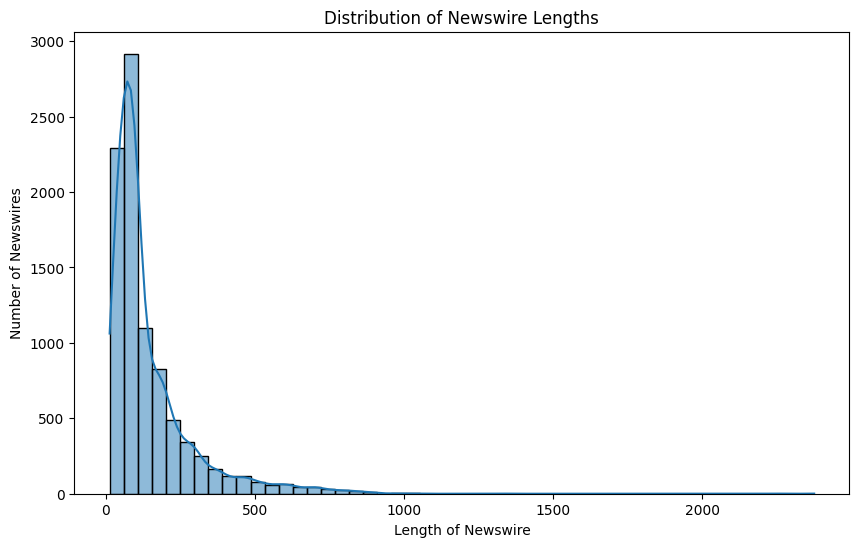

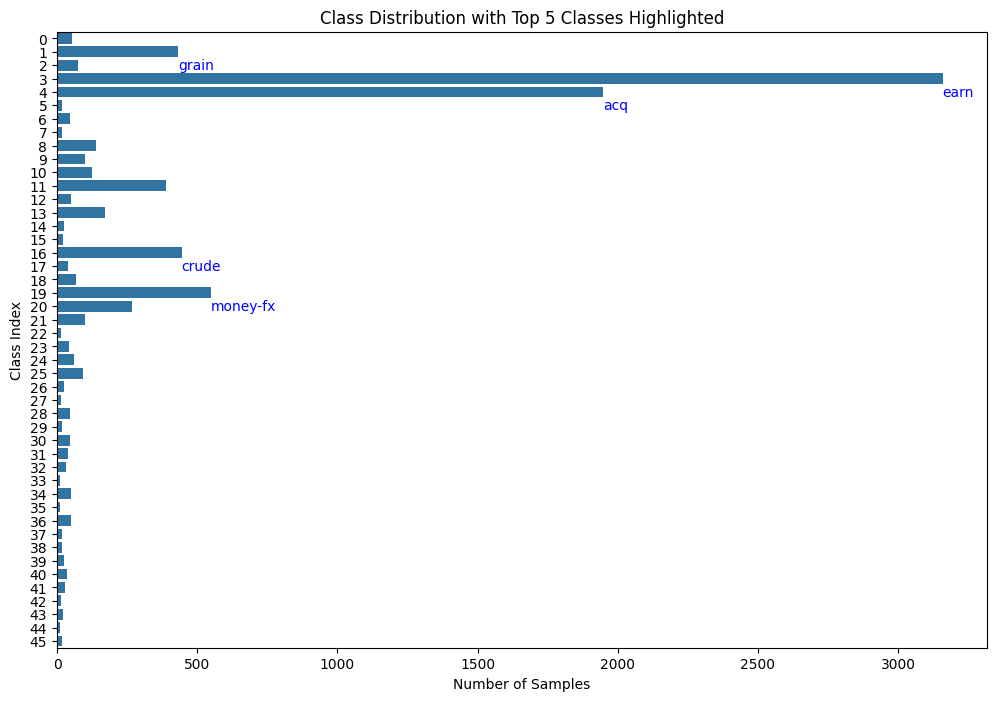

In [ ]:
plot_newswire_lengths(X_train)
plot_class_distribution_with_annotations(y_train)


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

def preprocess_data(X_train, X_test, y_train, weights=False):

    # Padding sequences to the same length
    X_train_full_padded = pad_sequences(X_train, padding='post')
    X_test_padded = pad_sequences(X_test, padding='post')

    # Stratified split to ensure class distribution remains consistent
    X_train, X_val, y_train, y_val = train_test_split(X_train_full_padded, y_train,
                                                    test_size=0.2, stratify=y_train,
                                                    random_state=42)

    # One-hot encoding the labels
    encoder = OneHotEncoder(sparse=False)
    y_train_onehot = encoder.fit_transform(y_train.reshape(-1, 1))
    y_val_onehot = encoder.transform(y_val.reshape(-1, 1))
    y_test_onehot = encoder.transform(y_test.reshape(-1, 1))

    if weights == True:
        # Calculate class weights to address imbalance
        class_weights = dict(enumerate(1 / np.bincount(y_train) * len(y_train) / 46))

        # Display the class weights to understand the adjustments made
        print("Class weights: ", class_weights)

        return [X_train, X_val, y_train_onehot, y_val_onehot, y_test_onehot, class_weights]

    return [X_train, X_val, y_train_onehot, y_val_onehot, y_test_onehot]

Imabalanced dataset

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


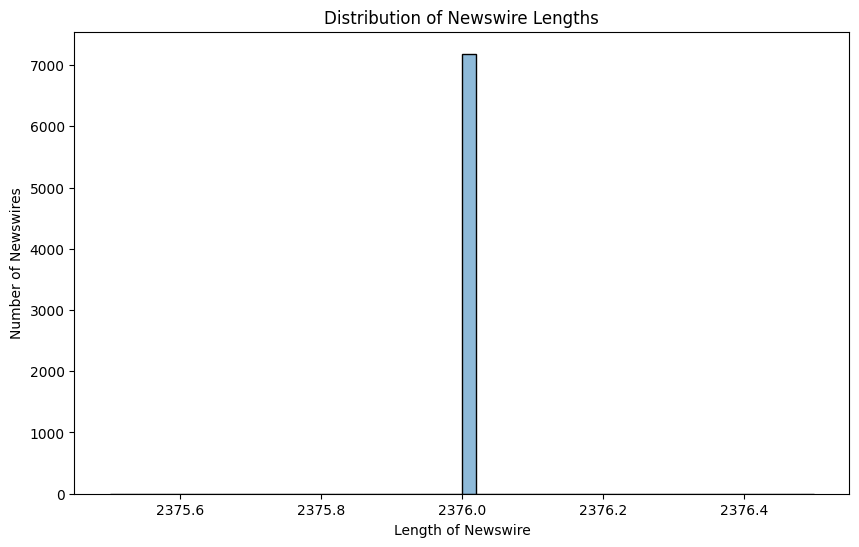

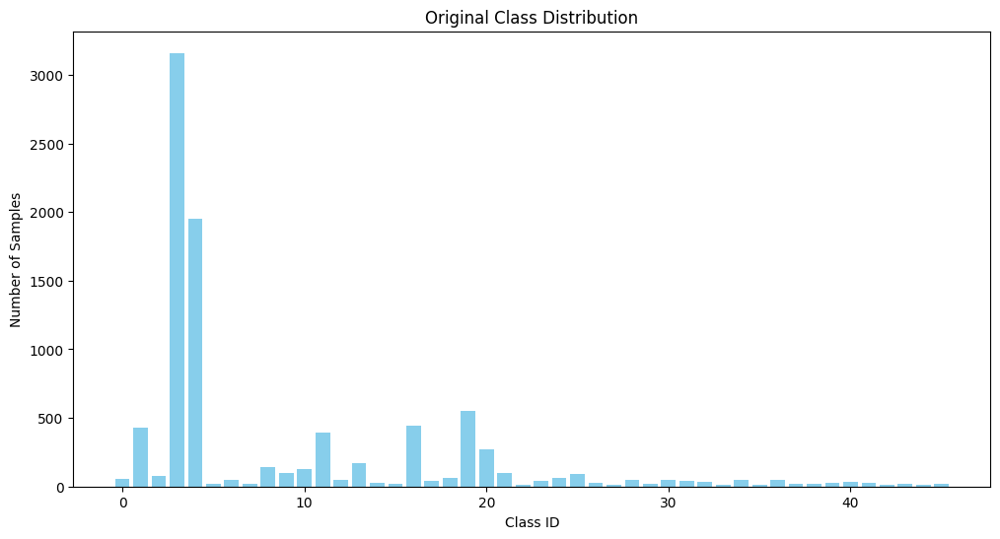

In [ ]:
unweighted_data = preprocess_data(X_train, X_test, y_train)
plot_newswire_lengths(unweighted_data[0])

# Count the occurrences of each class in the original dataset
class_counts = np.bincount(y_train)

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(range(46), class_counts, color='skyblue')
plt.title('Original Class Distribution')
plt.xlabel('Class ID')
plt.ylabel('Number of Samples')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Class weights:  {0: 3.5499011857707514, 1: 0.45143252073385265, 2: 2.6473839351510686, 3: 0.0618107052528346, 4: 0.10018964218980952, 5: 11.156832298136646, 6: 4.110411899313501, 7: 12.01505016722408, 8: 1.4071680376028202, 9: 1.928341384863124, 10: 1.5777338603425561, 11: 0.5006270903010034, 12: 4.005016722408027, 13: 1.1318525519848772, 14: 7.437888198757763, 15: 9.762228260869565, 16: 0.439987752602572, 17: 5.038569424964937, 18: 2.9470877768662835, 19: 0.3557987521045855, 20: 0.7264914054600606, 21: 1.952445652173913, 22: 13.016304347826088, 23: 4.733201581027668, 24: 3.1239130434782614, 25: 2.1107520564042304, 26: 8.220823798627002, 27: 13.016304347826088, 28: 4.110411899313501, 29: 10.41304347826087, 30: 4.338768115942028, 31: 5.038569424964937, 32: 6.00752508361204, 33: 17.355072463768114, 34: 3.904891304347826, 35: 19.52445652173913, 36: 4.005016722408027, 37: 10.41304347826087, 38: 10.41304347826087, 39: 8.220823798627002, 40: 5.386056971514243, 41: 6.508152173913044, 42: 15.6

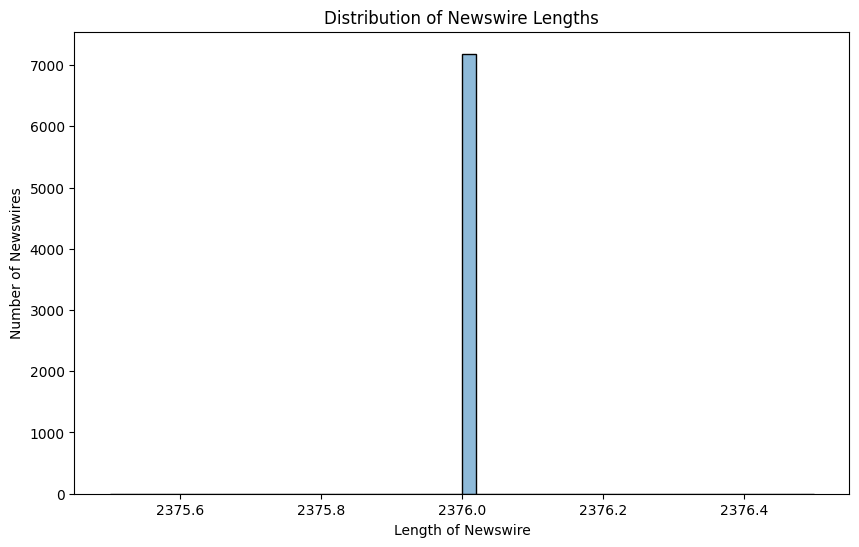

In [ ]:
weighted_data = preprocess_data(X_train, X_test, y_train, weights=True)
plot_newswire_lengths(weighted_data[0])

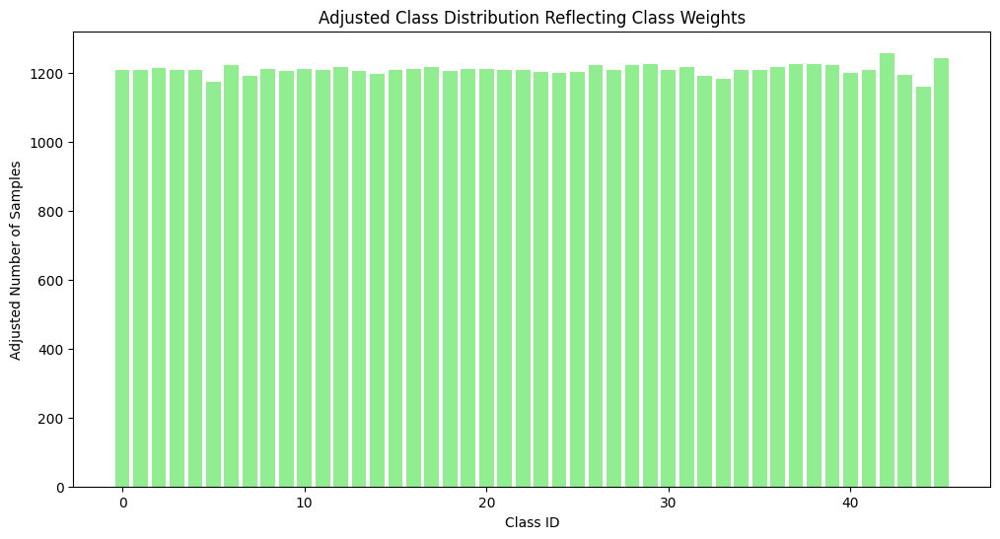

In [ ]:
# Adjust class counts based on class weights
adjusted_counts = class_counts * np.array(list(weighted_data[5].values())) * np.mean(list(weighted_data[5].values()))

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(range(46), adjusted_counts, color='lightgreen')
plt.title('Adjusted Class Distribution Reflecting Class Weights')
plt.xlabel('Class ID')
plt.ylabel('Adjusted Number of Samples')
plt.show()

### Neural Network Architecture Design

1. Input Layer

- Embedding Layer: Since our data is text, we start with an Embedding layer that turns positive integers (indexes) into dense vectors of fixed size. This layer will learn the embeddings for all the words in our dataset.
- input_dim: This should be set to the size of the vocabulary. We've limited our dataset to the top 10,000 words, so this will be 10,000.
- output_dim: The dimensionality of the word embeddings. Choosing around 100 to 200 can capture word semantics well.
- input_length: The length of input sequences, which we've fixed during preprocessing.

2. Hidden Layers

- First Hidden Layer: A GlobalAveragePooling1D layer could be used after the Embedding layer to reduce the dimensionality and average out the embeddings, simplifying the model by reducing the total number of parameters.
- Dense Layers: Following that, one or more Dense layers with a ReLU activation function could be added. It's typical to start with a higher number of neurons and potentially reduce them in further layers.
- Dropout layers might be included to prevent overfitting, especially if the model is deep or the dataset is not large.

3. Output Layer

- Final Dense Layer: Since it's a multi-class classification problem with 46 unique classes, the output layer should be a Dense layer with 46 neurons, one for each class.
- The activation function should be softmax, which will output a probability distribution over the 46 classes.

4. Compilation

- Optimizer: adam is a good default choice for many problems.
- Loss Function: For multi-class classification, categorical_crossentropy is the appropriate loss function.
- Metrics: Since this is a classification problem, accuracy is a useful metric to track.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, GlobalAveragePooling1D, Dense, Dropout

model = Sequential([
    Embedding(input_dim=10000,
              output_dim=128), # 128-dimensional embedding for each of the 10,000 words.
    GlobalAveragePooling1D(), # Reduces the dimensionality
    Dense(128, activation='relu'),
    Dropout(0.5), # 50% is chosen here to mitigate overfitting
    Dense(46, activation='softmax') # for multinomial probability distribution
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 128)         1280000   
                                                                 
 global_average_pooling1d (  (None, 128)               0         
 GlobalAveragePooling1D)                                         
                                                                 
 dense (Dense)               (None, 128)               16512     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 46)                5934      
                                                                 
Total params: 1302446 (4.97 MB)
Trainable params: 1302446 (4.97 MB)
Non-trainable params: 0 (0.00 Byte)
__________________

In [ ]:
# results with a model without stratified sampling nor class weights
history = model.fit(X_train, unweighted_data[2], epochs=20, validation_data=(unweighted_data[1], unweighted_data[3]))

evaluation = model.evaluate(X_test, unweighted_data[4])
print(f'Test Loss: {evaluation[0]}, Test Accuracy: {evaluation[1]}')

# around 12% improvement with stratified sampling (replicate)

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type list).

In [ ]:
# with balanced data (i.e., weighted classes)

history = model.fit(X_train, y_train_onehot,
                    epochs=20,  # The number of epochs is a hyperparameter you can tune
                    batch_size=512,  # Also tunable
                    validation_data=(X_val, y_val_onehot),
                    class_weight=class_weights)  # Applying class weights here

evaluation = model.evaluate(X_test_padded, y_test_onehot)
print(f'Test Loss: {evaluation[0]}, Test Accuracy: {evaluation[1]}')

Epoch 1/20


ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1150, in train_step
        y_pred = self(x, training=True)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_1" is incompatible with the layer: expected shape=(None, 200), found shape=(None, 2376)


In [ ]:
K = tf.keras.backend

class ExponentialLearningRate(tf.keras.callbacks.Callback):
    def __init__(self, factor):
        self.factor = factor
        self.rates = []
        self.losses = []
    def on_batch_end(self, batch, logs):
        self.rates.append(K.get_value(self.model.optimizer.learning_rate))
        self.losses.append(logs["loss"])
        K.set_value(self.model.optimizer.learning_rate, self.model.optimizer.learning_rate * self.factor)

In [ ]:
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[28, 28]),
    tf.keras.layers.Dense(300, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax")
])

optimizer = tf.keras.optimizers.SGD(learning_rate=1e-3)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

expon_lr = ExponentialLearningRate(factor=1.005)

history = model.fit(X_train, y_train, epochs=1,
                    validation_data=(X_valid, y_valid),
                    callbacks=[expon_lr])

1719/1719 [==============================] - 14s 8ms/step - loss: nan - accuracy: 0.5910 - val_loss: nan - val_accuracy: 0.0958


Text(0, 0.5, 'Loss')

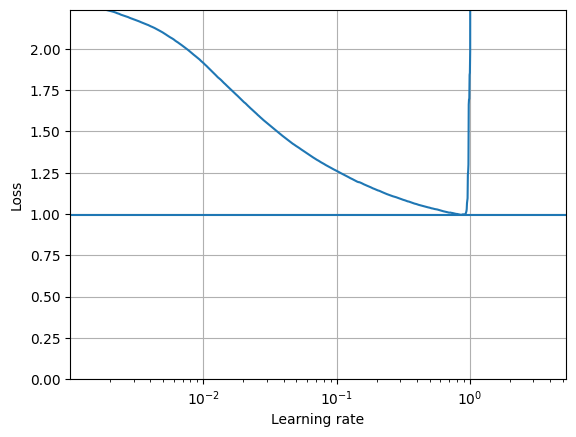

In [ ]:
plt.plot(expon_lr.rates, expon_lr.losses)
plt.gca().set_xscale('log')
plt.hlines(min(expon_lr.losses), min(expon_lr.rates), max(expon_lr.rates))
plt.axis([min(expon_lr.rates), max(expon_lr.rates), 0, expon_lr.losses[0]])
plt.grid()
plt.xlabel("Learning rate")
plt.ylabel("Loss")

In [ ]:
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
from pathlib import Path

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[28, 28]),
    tf.keras.layers.Dense(300, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(10, activation="softmax")
])

optimizer = tf.keras.optimizers.SGD(learning_rate=3e-1)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=20)
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_mnist_model", save_best_only=True)

run_index = 1 # increment this at every run
run_logdir = Path() / "my_mnist_logs" / "run_{:03d}".format(run_index)
tensorboard_cb = tf.keras.callbacks.TensorBoard(run_logdir)

history = model.fit(X_train, y_train, epochs=100,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb, early_stopping_cb, tensorboard_cb])

Epoch 1/100
1719/1719 [==============================] - 14s 8ms/step - loss: 0.2350 - accuracy: 0.9271 - val_loss: 0.1063 - val_accuracy: 0.9700
Epoch 2/100
1719/1719 [==============================] - 11s 6ms/step - loss: 0.0948 - accuracy: 0.9708 - val_loss: 0.1078 - val_accuracy: 0.9682
Epoch 3/100
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0652 - accuracy: 0.9792 - val_loss: 0.0754 - val_accuracy: 0.9752
Epoch 4/100
1719/1719 [==============================] - 8s 5ms/step - loss: 0.0477 - accuracy: 0.9842 - val_loss: 0.0803 - val_accuracy: 0.9778
Epoch 5/100
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0373 - accuracy: 0.9877 - val_loss: 0.0838 - val_accuracy: 0.9770
Epoch 6/100
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0292 - accuracy: 0.9906 - val_loss: 0.0827 - val_accuracy: 0.9790
Epoch 7/100
1719/1719 [==============================] - 9s 5ms/step - loss: 0.0230 - accuracy: 0.9921 - val_loss: 0.0818 - val_

In [ ]:
model = tf.keras.models.load_model("my_mnist_model") # rollback to best model
model.evaluate(X_test, y_test)

313/313 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.9749


[0.08914639055728912, 0.9749000072479248]

In [ ]:
import sys

if "google.colab" in sys.modules:  # extra code
    %pip install -q -U tensorboard-plugin-profile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 20.6 MB/s eta 0:00:00


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_mnist_logs

<IPython.core.display.Javascript object>